# Process FAST metadata XML

This file describes sites, locations, number of lanes, etc.

Use this to determine an interesting site and its upstream and downstream sites.

# Imports and Setup

In [1]:
import xmltodict
import pandas as pd
from pathlib import Path
from dask.distributed import Client
import dask.dataframe as dd
import numpy as np

from dotenv import dotenv_values

import holoviews as hv
import hvplot.pandas
pd.options.plotting.backend = 'holoviews'

from IPython.display import Image

In [2]:
cfg = dotenv_values()

In [3]:
root_dir = Path(cfg['root_dir'])
data_dir = Path(cfg['data_dir'])

In [4]:
client = Client()
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:8787/status,
Dashboard: http://127.0.0.1:8787/status,Workers: 4
Total threads: 4,Total memory: 11.90 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:59474,Workers: 4
Dashboard: http://127.0.0.1:8787/status,Total threads: 4
Started: Just now,Total memory: 11.90 GiB
Comm: tcp://192.168.4.22:59501,Total threads: 1
Dashboard: http://192.168.4.22:59508/status,Memory: 2.97 GiB
Nanny: tcp://127.0.0.1:59479,


In [7]:
meta_file = Path(root_dir / 'working/FASTmetadata.xml')
with open(meta_file) as f:
    xml_data = f.read()
    raw_data = xmltodict.parse(xml_data)

Make a map of detector locations

In [8]:
# each point is a tuple (longitude, latitude, label)
all_detectors = raw_data['DetectorInventory']['detector-list']['detector']
D = [()] * len(all_detectors)
for i, detector in enumerate(all_detectors):
    this_lon = float(detector['detector-location']['longitude'])
    this_lat = float(detector['detector-location']['latitude'])
    if (this_lon < -1.0) & (this_lat > 1.0):
        D[i] = (this_lon, this_lat, detector['detector-id'])


In [9]:
D[500]

(-115.322273254395, 35.7851676940918, '444_1_100')

In [10]:
import geoviews as gv
import geoviews.feature as gf
from geoviews import opts
from cartopy import crs 
import geoviews.tile_sources as gts
from bokeh.models import HoverTool
#gv.extension('bokeh', 'matplotlib')

In [11]:
points = gv.Points(D, kdims=['longitude', 'latitude'], vdims='detector-id', label='detector-id')
points.opts(size=12, marker='o', color='black', fill_color=None, line_width=1, tools=['hover'], show_legend=False)

imagery_tiles = gv.tile_sources.EsriImagery(alpha=0.75)
osm_tiles = gv.tile_sources.OSM().opts(alpha=0.5)

In [12]:
layout = imagery_tiles * osm_tiles * points
layout.opts(width=1000, height=700, title='Las Vegas Area Highway Speed Detectors')

:Overlay
   .WMTS.I                          :WMTS   [Longitude,Latitude]
   .WMTS.II                         :WMTS   [Longitude,Latitude]
   .Points.Detector_hyphen_minus_id :Points   [longitude,latitude]   (detector-id)

In [64]:
hv.save(layout, root_dir / 'reports/figures/detector_locations.png', fmt='png')

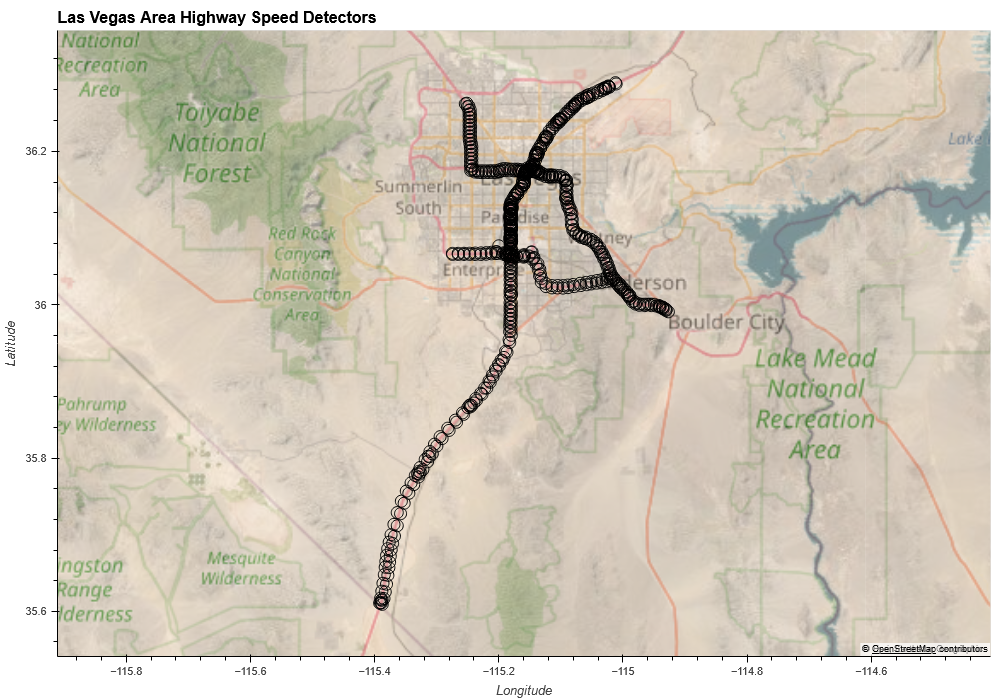

In [13]:
Image(root_dir / 'reports/figures/detector_locations.png')

Select which three detectors to use for the analysis.

Output some metadata to an excel file.

In [14]:
list_of_detectors = raw_data['DetectorInventory']['detector-list']['detector']

In [15]:
list_of_detectors = raw_data['DetectorInventory']['detector-list']['detector']
list_of_detectors[100]

OrderedDict([('detector-id', '112_2_44'),
             ('organization-id', 'NDOT-TTID'),
             ('station-id', '44'),
             ('detector-name',
              'I-15 NB between I-15 NB Charleston EB Off-Ramp and I-15 NB Charleston WB Off-Ramp'),
             ('detector-location',
              OrderedDict([('latitude', '36.1563301086426'),
                           ('longitude', '-115.159843444824')])),
             ('route-designator', 'I-15 NB'),
             ('detector-direction', '1'),
             ('linear-reference', '41.61'),
             ('detector-type', '5'),
             ('measurement-duration', '60'),
             ('class1-count-length', '8'),
             ('class2-count-length', '18'),
             ('class3-count-length', '24'),
             ('class4-count-length', '40'),
             ('class5-count-length', '80'),
             ('class6-count-length', '100'),
             ('detection-lane',
              OrderedDict([('detection-lane-item',
                      

In [16]:
d = list_of_detectors[10]
a = [d['detector-id'],
     d['detector-name'],
     d['route-designator'],
     d['detector-direction'],
     d['linear-reference'],
     len(d['detection-lane']['detection-lane-item'])]
print(a)
columns = ['id', 'name', 'route', 'direction', 'mile', 'numlanes']

['9_1_3', 'I-215 WB between I-15 SB to I-215 WB/EB Ramp and I-215 WB Decatur Off-Ramp', 'I-215 WB', '7', '99.55', 4]


In [17]:
columns = ['id', 'name', 'route', 'direction', 'mile', 'numlanes']
print(columns)
all_detectors = []
for d in list_of_detectors:
    a = [d['detector-id'],
         d['detector-name'],
         d['route-designator'],
         d['detector-direction'],
         d['linear-reference'],
         len(d['detection-lane']['detection-lane-item'])]
    all_detectors.append(a)


['id', 'name', 'route', 'direction', 'mile', 'numlanes']


In [18]:
D = pd.DataFrame(all_detectors, columns=columns)

In [30]:
D.to_excel(Path('c:/projects/nrel-presentation/working/FASTmetadata.xlsx'), index=False)

after looking at excel file, these are the sites we'll us:

site to predict: 355_2_135

from upstream to downstream:

    355_1_156, 355_2_153, 355_3_155
    miles 31.48, 31.84, 32.25

In [19]:
D

,id,name,route,direction,mile,numlanes
0,2_1_268,I-215 EB between I-215 EB Decatur Off-Ramp and...,I-215 EB,3,101.41,4
1,2_2_267,I-215 EB between I-215 EB Decatur Off-Ramp and...,I-215 EB,3,100.56,4
2,3_2_1,I-215 EB Decatur On-Ramp between Decatur Road ...,I-215 EB Decatur On-Ramp,3,98.604,3
3,4_1_1,I-215 EB between I-215 EB Decatur On-Ramp and ...,I-215 EB,3,100.31,4
4,4_2_4,I-215 EB between I-215 EB Decatur On-Ramp and ...,I-215 EB,3,100.04,4
...,...,...,...,...,...,...
687,585_1_432,I-15 SB 215 CC On Ramp between 215 CC and I-15 SB,I-15 SB 215 CC On Ramp,5,34.5,3
688,586_1_434,I-15 SB 215 CC Off Ramp between I-15 SB and 21...,I-15 SB 215 CC Off Ramp,5,35.5,3
689,587_1_427,I-15 SB Lamb On Ramp between Lamb and I-15 SB,I-15 SB Lamb On Ramp,5,32.5,3
690,588_1_422,I-15 SB Lamb Off Ramp between I-15 SB and Lamb,I-15 SB Lamb Off Ramp,5,33.5,3


In [20]:
D[D['id'].isin(['358_1_325', '358_2_320', '358_3_319'])]

,id,name,route,direction,mile,numlanes
267,358_1_325,I-15 NB between Erie Avenue and Barbara Lane,I-15 NB,1,28.16,3
268,358_2_320,I-15 NB between Erie Avenue and Barbara Lane,I-15 NB,1,28.48,3
269,358_3_319,I-15 NB between Erie Avenue and Barbara Lane,I-15 NB,1,28.85,3


# Exploratory Data Analysis

In [21]:
# plot data for one route
this_route = 'I-15 NB'
D_I15NB = D[D['route']=='I-15 NB'].copy()
D_I15NB['mile'] = D_I15NB['mile'].astype('float')
D_I15NB['numlanes'] = D_I15NB['numlanes'].astype('int')
D_I15NB.sort_values(by='mile', inplace=True)
D_I15NB

,id,name,route,direction,mile,numlanes
520,451_1_99,I-15 NB between 11.71 Miles south of Sloan Roa...,I-15 NB,1,0.00,2
518,450_1_99,I-15 NB between 10.71 Miles south of Sloan Roa...,I-15 NB,1,0.40,2
519,450_2_359,I-15 NB between 10.71 Miles south of Sloan Roa...,I-15 NB,1,0.90,3
515,449_1_358,I-15 NB between 9.71 Miles south of Sloan Road...,I-15 NB,1,1.41,3
516,449_2_357,I-15 NB between 9.71 Miles south of Sloan Road...,I-15 NB,1,2.01,3
...,...,...,...,...,...,...
388,402_2_439,I-15 NB between Clark County 215 and Centennia...,I-15 NB,1,52.57,2
389,402_3_443,I-15 NB between Clark County 215 and Centennia...,I-15 NB,1,52.87,3
390,402_4_444,I-15 NB between Clark County 215 and Centennia...,I-15 NB,1,53.39,2
391,403_1_447,I-15 NB between Centennial Parkway and Speedwa...,I-15 NB,1,53.94,2


Plot detector by mile marker, sized by number of lanes

In [22]:
scatter = D_I15NB.hvplot.scatter(x='mile', y='direction', hover_cols='all')
scatter.opts(color='blue', size=hv.dim('numlanes')**1.5, width=1200, alpha=0.5, line_color='black')
scatter

:Scatter   [mile]   (direction,index,id,name,route,numlanes)

# Read raw (interim) data
For each parquet file, read all data from I-15 NB stations

In [23]:
D.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 692 entries, 0 to 691
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   id         692 non-null    object
 1   name       692 non-null    object
 2   route      692 non-null    object
 3   direction  692 non-null    object
 4   mile       692 non-null    object
 5   numlanes   692 non-null    int64 
dtypes: int64(1), object(5)
memory usage: 32.6+ KB


In [24]:
# change dtypes
D = D.astype({'mile': float})
D.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 692 entries, 0 to 691
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   id         692 non-null    object 
 1   name       692 non-null    object 
 2   route      692 non-null    object 
 3   direction  692 non-null    object 
 4   mile       692 non-null    float64
 5   numlanes   692 non-null    int64  
dtypes: float64(1), int64(1), object(4)
memory usage: 32.6+ KB


In [25]:
# select data between miles 2 and 30
idx = (D['route'] == 'I-15 NB') & (2.0 < D['mile']) & (D['mile'] < 30.0)

In [26]:
all_stations = D[idx]['id'].values

In [27]:
# directory of interim parquet files
pqdir = data_dir / 'interim/'

## Dask

In [40]:
df = dd.read_parquet(pqdir / '*.pq',
                     columns=['detector_id', 'timestamp', 'lane_vehicle_speed', 'lane_vehicle_count', 'occupancy'])

C:\Users\David\miniconda3\envs\py38_nrel\lib\statistics.py:168: RuntimeWarning: overflow encountered in long_scalars
  partials[d] = partials_get(d, 0) + n
C:\Users\David\miniconda3\envs\py38_nrel\lib\statistics.py:168: RuntimeWarning: overflow encountered in long_scalars
  partials[d] = partials_get(d, 0) + n


In [41]:
df = df[df['detector_id'].isin(all_stations)].compute()

C:\Users\David\miniconda3\envs\py38_nrel\lib\statistics.py:168: RuntimeWarning: overflow encountered in long_scalars
  partials[d] = partials_get(d, 0) + n


In [42]:
df

,detector_id,timestamp,lane_vehicle_speed,lane_vehicle_count,occupancy
544,357_3_310,2021-10-26 20:01:27,86,3,1
545,357_3_310,2021-10-26 20:01:27,73,5,6
546,357_3_310,2021-10-26 20:01:27,74,6,4
1210,437_3_327,2021-10-26 20:01:27,149,0,0
1211,437_3_327,2021-10-26 20:01:27,149,0,0
...,...,...,...,...,...
1291,448_1_355,2021-11-16 10:15:06,66,3,1
1292,448_1_355,2021-11-16 10:15:06,60,3,2
1293,448_3_353,2021-11-16 10:15:06,76,6,1
1294,448_3_353,2021-11-16 10:15:06,55,5,1


C:\Users\David\miniconda3\envs\py38_nrel\lib\statistics.py:168: RuntimeWarning: overflow encountered in long_scalars
  partials[d] = partials_get(d, 0) + n


In [70]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1685528 entries, 2021-10-26 20:01:27 to 2021-11-16 10:15:06
Data columns (total 4 columns):
 #   Column              Non-Null Count    Dtype  
---  ------              --------------    -----  
 0   detector_id         1685528 non-null  object 
 1   lane_vehicle_speed  1408312 non-null  float64
 2   lane_vehicle_count  1685528 non-null  int64  
 3   occupancy           1685528 non-null  int64  
dtypes: float64(1), int64(2), object(1)
memory usage: 64.3+ MB


In [44]:
all_stations

array(['357_1_312', '357_2_311', '357_3_310', '358_1_325', '358_2_320',
       '358_3_319', '359_1_325', '437_1_101', '437_3_327', '438_1_331',
       '438_2_330', '438_3_329', '439_1_334', '439_2_333', '439_3_332',
       '440_1_335', '441_1_338', '441_2_337', '441_3_336', '442_1_341',
       '442_2_340', '442_3_339', '443_1_344', '443_2_343', '443_3_342',
       '444_1_100', '444_2_100', '444_3_345', '445_1_348', '445_2_347',
       '445_3_346', '446_1_350', '446_2_78', '446_3_349', '447_1_352',
       '447_2_351', '447_3_77', '448_1_355', '448_2_354', '448_3_353',
       '449_2_357', '449_3_356'], dtype=object)

## Clean

In [29]:
df.set_index('timestamp', inplace=True)

KeyError: "None of ['timestamp'] are in the columns"

Set speeds above 120 mph to nan.

In [30]:
# speeds > 120 = np.nan
idx = df['lane_vehicle_speed'] > 119
df.loc[idx, 'lane_vehicle_speed'] = np.nan

## Save
Save to working directory so we don't have to do all that processing again next time

In [74]:
df.to_parquet(root_dir / 'working/df.parquet')

C:\Users\David\miniconda3\envs\py38_nrel\lib\statistics.py:168: RuntimeWarning: overflow encountered in long_scalars
  partials[d] = partials_get(d, 0) + n


## Plot

In [31]:
pd.options.plotting.backend = 'holoviews'
import hvplot.pandas

In [32]:
# pick 5 stations for plotting, just to look at the data
this_df = df[df['detector_id'].isin(all_stations[10:14])]

In [33]:
this_df

,detector_id,lane_vehicle_speed,lane_vehicle_count,occupancy
timestamp,,,,
2021-10-26 20:01:27,438_2_330,NaN,0,0
2021-10-26 20:01:27,438_2_330,NaN,0,0
2021-10-26 20:01:27,438_2_330,NaN,0,0
2021-10-26 20:01:27,438_3_329,73.0,6,1
2021-10-26 20:01:27,438_3_329,72.0,5,2
...,...,...,...,...
2021-11-16 10:15:06,439_1_334,67.0,6,1
2021-11-16 10:15:06,439_1_334,53.0,6,6
2021-11-16 10:15:06,439_2_333,78.0,1,1


In [34]:
sample_plot = \
this_df[['detector_id', 'lane_vehicle_speed']].hvplot.scatter(by='detector_id',
                                                              title='Lane Vehicle Speed',
                                                              ylabel='Speed (mph)',
                                                              xlabel='Date',
                                                              alpha=0.5,
                                                              size=10,
                                                              width=800,
                                                              height=500)
sample_plot

:NdOverlay   [detector_id]
   :Scatter   [timestamp]   (lane_vehicle_speed)

In [36]:
hv.save(sample_plot, root_dir / 'reports/figures/sample_lane_detector_speed.png', fmt='png')

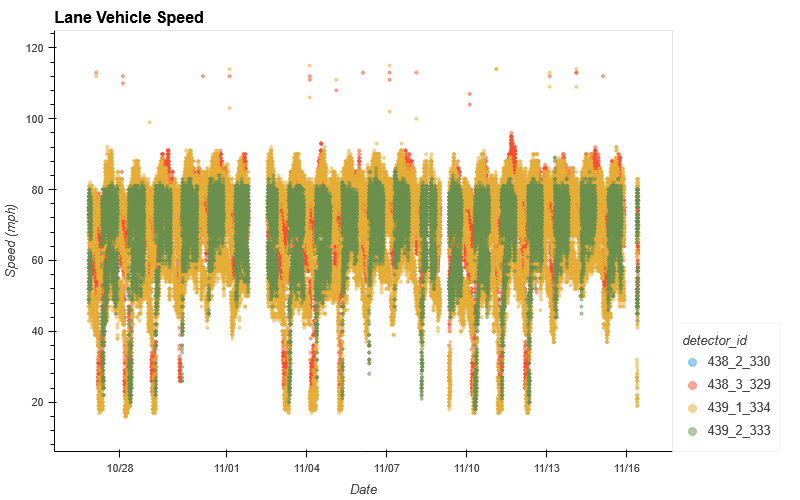

In [37]:
Image(root_dir / 'reports/figures/sample_lane_detector_speed.png')

In [38]:
this_df

,detector_id,lane_vehicle_speed,lane_vehicle_count,occupancy
timestamp,,,,
2021-10-26 20:01:27,438_2_330,NaN,0,0
2021-10-26 20:01:27,438_2_330,NaN,0,0
2021-10-26 20:01:27,438_2_330,NaN,0,0
2021-10-26 20:01:27,438_3_329,73.0,6,1
2021-10-26 20:01:27,438_3_329,72.0,5,2
...,...,...,...,...
2021-11-16 10:15:06,439_1_334,67.0,6,1
2021-11-16 10:15:06,439_1_334,53.0,6,6
2021-11-16 10:15:06,439_2_333,78.0,1,1


In [39]:
this_df2 = df[df['detector_id'].isin(['447_2_351', '446_1_350', '446_3_349'])]
this_df2[['detector_id', 'lane_vehicle_speed']].hvplot.line(by='detector_id',
                                                              #title='Lane Vehicle Speed',
                                                              ylabel='Speed (mph)',
                                                              xlabel='Date',
                                                              ylim=(0, 120),
                                                              size=10,
                                                              width=900,
                                                              height=250,
                                                              subplots=True).cols(1)

:NdLayout   [detector_id]
   :Curve   [timestamp]   (lane_vehicle_speed)